#  

In [1]:
# Loaded variable 'df' from URI: i:\My Drive\Data Science\Sri Vipra\Kaggle Datset\city_day.csv
import pandas as pd
import numpy as np
import plotly.express as px

df = pd.read_csv(r"C:\Users\malli\Documents\GitHub\Air-Quality-Prediction--A-Case-of-Indian-Cities\Preprocessing and EDA\city_day_data.csv")
df = df.drop(['NO', 'NO2', 'Benzene','Toluene','Xylene'], axis=1)


# Data Cleaning

## Dealing with Missing Values

In [2]:
df.shape
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29531 entries, 0 to 29530
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   City        29531 non-null  object 
 1   Date        29531 non-null  object 
 2   PM2.5       24933 non-null  float64
 3   PM10        18391 non-null  float64
 4   NOx         25346 non-null  float64
 5   NH3         19203 non-null  float64
 6   CO          27472 non-null  float64
 7   SO2         25677 non-null  float64
 8   O3          25509 non-null  float64
 9   AQI         24850 non-null  float64
 10  AQI_Bucket  24850 non-null  object 
dtypes: float64(8), object(3)
memory usage: 2.5+ MB


In [3]:
df.isnull().mean() * 100

City           0.000000
Date           0.000000
PM2.5         15.570079
PM10          37.723071
NOx           14.171549
NH3           34.973418
CO             6.972334
SO2           13.050692
O3            13.619586
AQI           15.851139
AQI_Bucket    15.851139
dtype: float64

In [4]:
fig = px.line(df, x='Date', y='AQI', color='City', title='AQI Time Series for All Cities')
fig.show()

fig2 = px.box(df, x='City', y='AQI', title='AQI Distribution by City')
#fig2.update_layout(xaxis={'categoryorder':'total descending'})
fig2.show()

# Scatter plot matrix for selected features
selected_features = ['PM2.5', 'PM10', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'AQI']
fig3 = px.scatter_matrix(df[selected_features], title='Scatter Plot Matrix')
fig3.show()


In [5]:
column_names = df.columns
print(column_names)

Index(['City', 'Date', 'PM2.5', 'PM10', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'AQI',
       'AQI_Bucket'],
      dtype='object')


<Axes: >

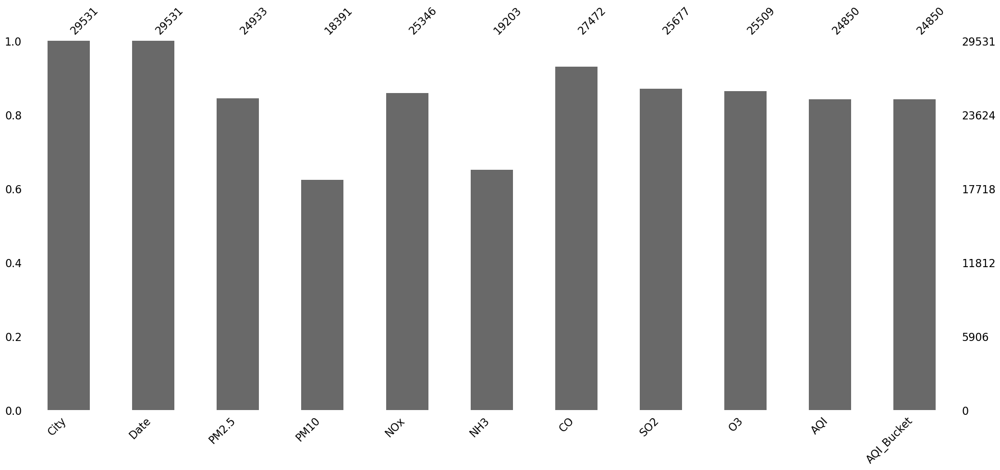

In [6]:
import missingno as msno
msno.bar(df)


<Axes: >

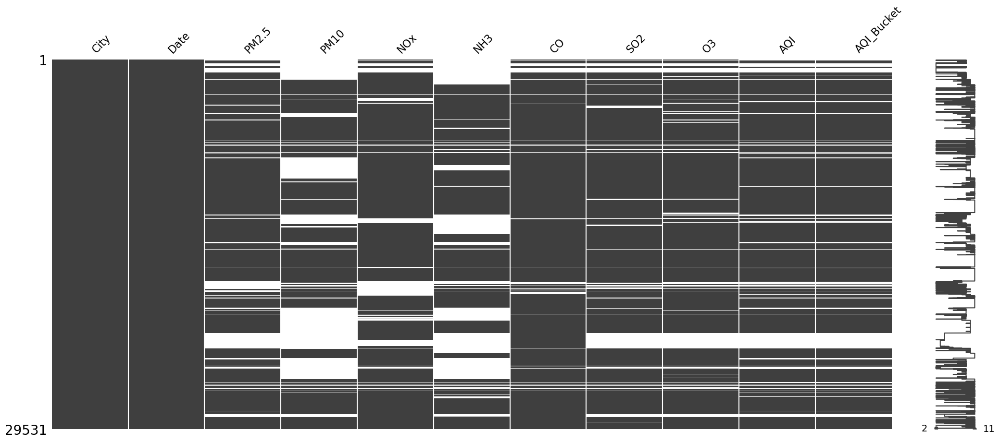

In [7]:
msno.matrix(df)

In [8]:
df['AQI'].isnull().sum()

np.int64(4681)

### Removing Rows with all data missing

In [9]:
columns_to_check = ['PM2.5', 'PM10', 'NOx', 'NH3', 'CO', 'SO2', 'O3']

In [10]:
# Counting rows where all the specified columns have missing values
num_rows_with_all_nulls = df[columns_to_check].isnull().all(axis=1).sum()
num_rows_with_all_nulls

np.int64(1571)

In [11]:
df_with_all_nulls = df[df[columns_to_check].isnull().all(axis=1)]

In [12]:
df_with_all_nulls.sample(10)

,City,Date,PM2.5,PM10,NOx,NH3,CO,SO2,O3,AQI,AQI_Bucket
18116,Jorapokhar,2018-06-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,98.0,Satisfactory
6946,Brajrajnagar,2018-11-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12685,Gurugram,2016-09-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.0,Satisfactory
26058,Talcher,2018-01-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2784,Amaravati,2019-09-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
740,Ahmedabad,2017-01-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
461,Ahmedabad,2016-04-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
26141,Talcher,2018-04-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
806,Ahmedabad,2017-03-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24115,Patna,2016-02-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
# Drop rows where all values in the specified columns are missing
df_cleaned = df.dropna(subset=columns_to_check, how='all')

<Axes: >

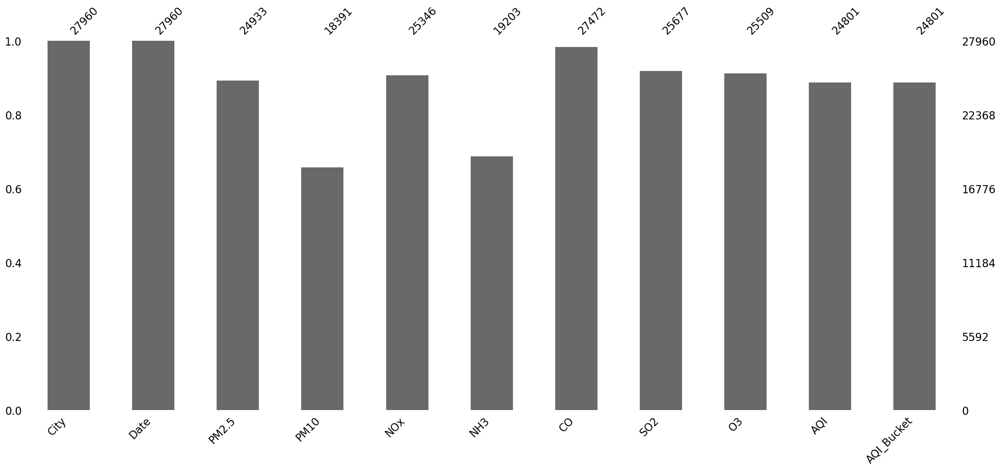

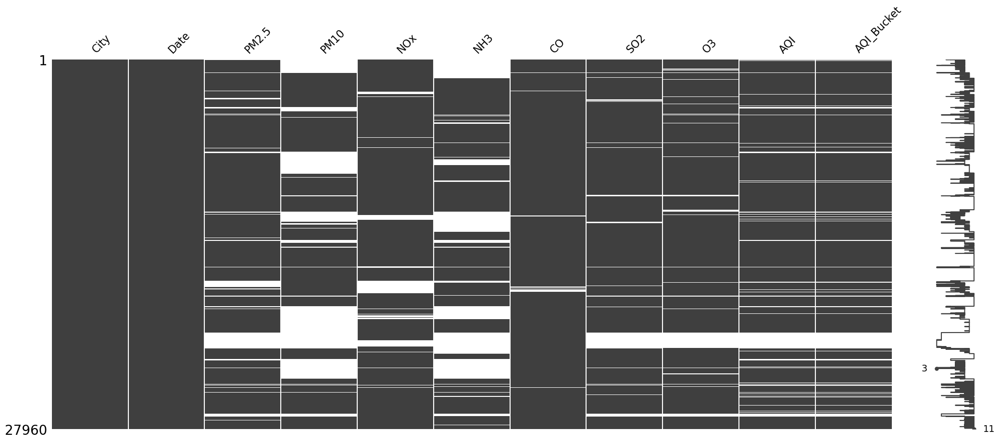

In [14]:
msno.bar(df_cleaned)
msno.matrix(df_cleaned)

### Removing rows which doesn't meet the conditions for AQI calculations 

In [15]:
# Atleast one of PM 2.5 or PM 1o should be recorded 
necessary_cols = ['PM2.5', 'PM10']

In [16]:
ineligible_for_aqi_1 = df[necessary_cols].isnull().all(axis=1).sum()
ineligible_for_aqi_1

np.int64(3839)

In [17]:
df_cleaned['AQI'].isnull().sum()

np.int64(3159)

In [18]:
df_with_all_nulls_1 = df_cleaned[df_cleaned[necessary_cols].isnull().all(axis=1)]
df_with_all_nulls_1.sample(5)
df_with_all_nulls_1

,City,Date,PM2.5,PM10,NOx,NH3,CO,SO2,O3,AQI,AQI_Bucket
0,Ahmedabad,2015-01-01,NaN,NaN,17.15,NaN,0.92,27.64,133.36,NaN,NaN
1,Ahmedabad,2015-01-02,NaN,NaN,16.46,NaN,0.97,24.55,34.06,NaN,NaN
2,Ahmedabad,2015-01-03,NaN,NaN,29.70,NaN,17.40,29.07,30.70,NaN,NaN
3,Ahmedabad,2015-01-04,NaN,NaN,17.97,NaN,1.70,18.59,36.08,NaN,NaN
4,Ahmedabad,2015-01-05,NaN,NaN,37.76,NaN,22.10,39.33,39.31,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
28550,Visakhapatnam,2017-10-25,NaN,NaN,0.00,0.23,0.00,NaN,NaN,NaN,NaN
28551,Visakhapatnam,2017-10-26,NaN,NaN,0.00,0.19,0.00,NaN,NaN,NaN,NaN
28553,Visakhapatnam,2017-10-28,NaN,NaN,0.00,0.17,0.00,NaN,NaN,NaN,NaN
28554,Visakhapatnam,2017-10-29,NaN,NaN,0.00,0.13,0.00,NaN,NaN,NaN,NaN


In [19]:
df_cleaned_1 = df_cleaned.dropna(subset=necessary_cols, how='all')


<Axes: >

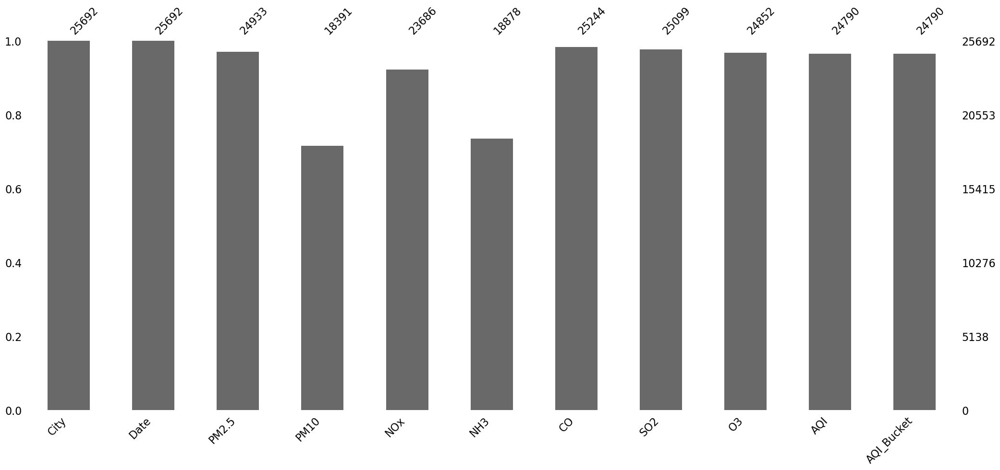

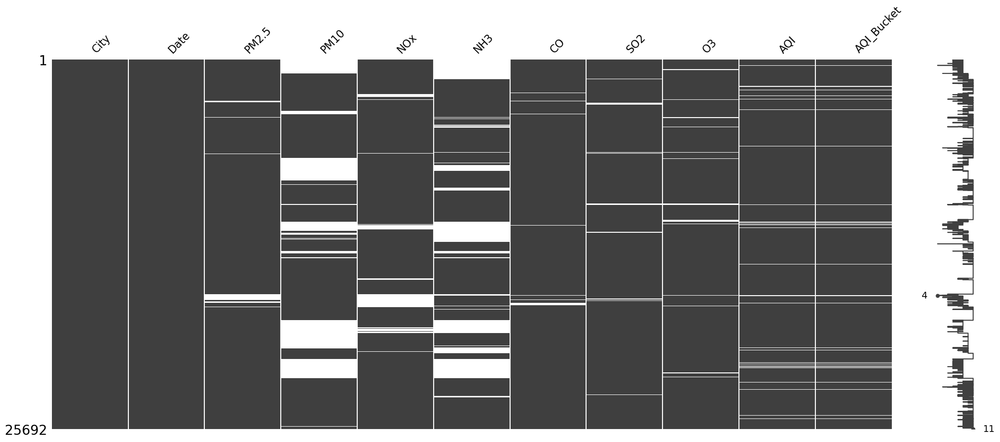

In [20]:
msno.bar(df_cleaned_1)
msno.matrix(df_cleaned_1)

In [21]:
df_cleaned_1.isnull().mean() * 100
df_cleaned_1

,City,Date,PM2.5,PM10,NOx,NH3,CO,SO2,O3,AQI,AQI_Bucket
27,Ahmedabad,2015-01-28,73.24,NaN,25.84,NaN,5.72,36.52,62.42,NaN,NaN
28,Ahmedabad,2015-01-29,83.13,NaN,33.72,NaN,6.93,49.52,59.76,209.0,Poor
29,Ahmedabad,2015-01-30,79.84,NaN,41.08,NaN,13.85,48.49,97.07,328.0,Very Poor
30,Ahmedabad,2015-01-31,94.52,NaN,52.61,NaN,24.39,67.39,111.33,514.0,Severe
31,Ahmedabad,2015-02-01,135.99,NaN,84.57,NaN,43.48,75.23,102.70,782.0,Severe
...,...,...,...,...,...,...,...,...,...,...,...
29526,Visakhapatnam,2020-06-27,15.02,50.94,19.54,12.47,0.47,8.55,23.30,41.0,Good
29527,Visakhapatnam,2020-06-28,24.38,74.09,16.53,11.99,0.52,12.72,30.14,70.0,Satisfactory
29528,Visakhapatnam,2020-06-29,22.91,65.73,18.33,10.71,0.48,8.42,30.96,68.0,Satisfactory
29529,Visakhapatnam,2020-06-30,16.64,49.97,18.80,10.03,0.52,9.84,28.30,54.0,Satisfactory


### Data which doesn't meet the eligibilty for AQI calculation still exists, time to remove them first!

In [22]:
columns_to_check = ['PM2.5', 'PM10', 'NOx', 'NH3', 'CO', 'SO2', 'O3']

# Condition 1: Both 'PM2.5' and 'PM10' are missing
condition_1 = df_cleaned_1['PM2.5'].isnull() & df_cleaned_1['PM10'].isnull()

# Condition 2: Strictly more than 4 columns out of the specified columns are missing
condition_2 = df_cleaned_1[columns_to_check].isnull().sum(axis=1) > 4

# Applying both conditions to filter the rows
filtered_df = df_cleaned_1[condition_1 | condition_2]


rows_to_remove = condition_1 | condition_2


df_cleaned_1_filtered = df_cleaned_1[~rows_to_remove]

In [23]:
df_cleaned_1_filtered = df_cleaned_1_filtered.sort_values(['AQI'], na_position='first')
df_cleaned_1_filtered

,City,Date,PM2.5,PM10,NOx,NH3,CO,SO2,O3,AQI,AQI_Bucket
27,Ahmedabad,2015-01-28,73.24,NaN,25.84,NaN,5.72,36.52,62.42,NaN,NaN
59,Ahmedabad,2015-03-01,61.12,NaN,20.92,NaN,3.58,28.44,30.48,NaN,NaN
65,Ahmedabad,2015-03-07,105.45,NaN,18.66,NaN,2.50,29.29,69.90,NaN,NaN
94,Ahmedabad,2015-04-05,156.76,NaN,20.97,NaN,3.92,26.32,37.11,NaN,NaN
99,Ahmedabad,2015-04-10,134.60,NaN,28.70,NaN,5.90,34.53,7.00,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
1463,Ahmedabad,2019-01-03,131.50,NaN,88.04,NaN,119.68,55.29,43.25,1719.0,Severe
1048,Ahmedabad,2017-11-14,207.19,NaN,159.36,NaN,118.02,160.06,37.21,1747.0,Severe
560,Ahmedabad,2016-07-14,38.13,NaN,43.98,NaN,46.51,23.13,NaN,1842.0,Severe
1136,Ahmedabad,2018-02-10,185.77,NaN,186.66,NaN,124.01,120.94,40.97,1917.0,Severe


<Axes: >

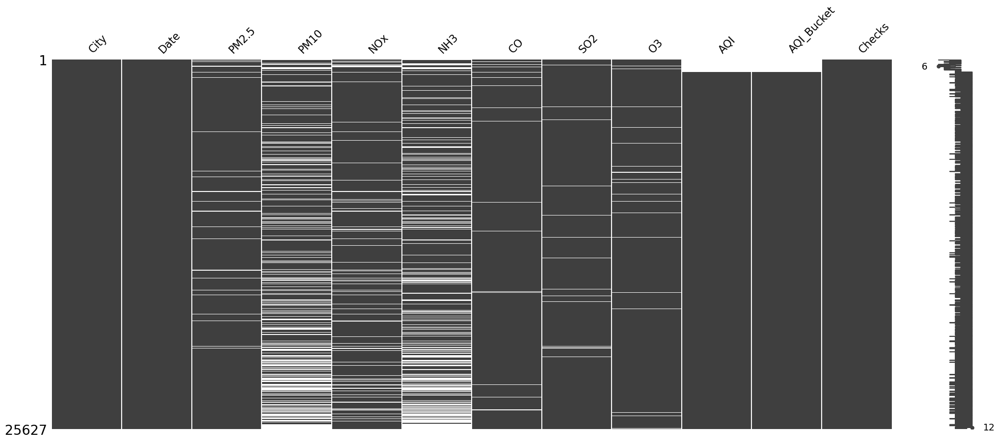

In [24]:
df_cleaned_master_1 = df_cleaned_1_filtered.copy()



df_cleaned_master_1.loc[:, "Checks"] = (
    (df_cleaned_master_1["PM2.5"] > 0).astype(int) + 
    (df_cleaned_master_1["PM10"] > 0).astype(int) + 
    (df_cleaned_master_1["NOx"] > 0).astype(int) + 
    (df_cleaned_master_1["NH3"] > 0).astype(int) + 
    (df_cleaned_master_1["CO"] > 0).astype(int) + 
    (df_cleaned_master_1["SO2"] > 0).astype(int) + 
    (df_cleaned_master_1["O3"] > 0).astype(int)
)

df_cleaned_master_1 = df_cleaned_master_1[df_cleaned_master_1['Checks'] >= 3]

msno.matrix(df_cleaned_master_1)


### Calculating missing AQI for available data rows

In [25]:
df_cleaned_master_big = df_cleaned_master_1[df_cleaned_master_1['AQI'].notna()]
df_cleaned_master_big.shape

(24750, 12)

In [26]:
df_cleaned_master_small = df_cleaned_master_1[df_cleaned_master_1['AQI'].isna()]
df_cleaned_master_small.shape

(877, 12)

<Axes: >

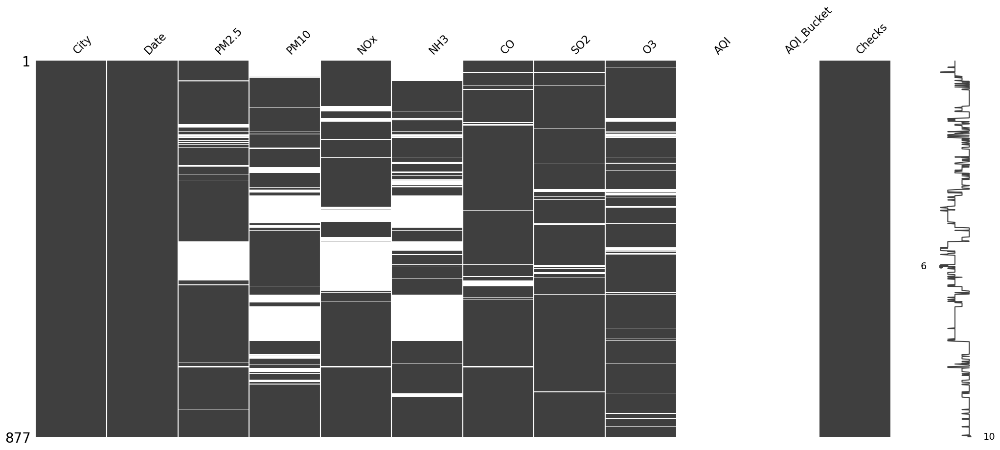

In [27]:
msno.matrix(df_cleaned_master_small)

# AQI Calculation

In [28]:
## PM2.5 Sub-Index calculation
def get_PM25_subindex(x):
    if x <= 30:
        return x * 50 / 30
    elif x <= 60:
        return 50 + (x - 30) * 50 / 30
    elif x <= 90:
        return 100 + (x - 60) * 100 / 30
    elif x <= 120:
        return 200 + (x - 90) * 100 / 30
    elif x <= 250:
        return 300 + (x - 120) * 100 / 130
    elif x > 250:
        return 400 + (x - 250) * 100 / 130
    else:
        return 0

df_cleaned_master_small["PM2.5_SubIndex"] = df_cleaned_master_small["PM2.5"].apply(lambda x: get_PM25_subindex(x))

## PM10 Sub-Index calculation
def get_PM10_subindex(x):
    if x <= 50:
        return x
    elif x <= 100:
        return x
    elif x <= 250:
        return 100 + (x - 100) * 100 / 150
    elif x <= 350:
        return 200 + (x - 250)
    elif x <= 430:
        return 300 + (x - 350) * 100 / 80
    elif x > 430:
        return 400 + (x - 430) * 100 / 80
    else:
        return 0

df_cleaned_master_small["PM10_SubIndex"] = df_cleaned_master_small["PM10"].apply(lambda x: get_PM10_subindex(x))

## SO2 Sub-Index calculation
def get_SO2_subindex(x):
    if x <= 40:
        return x * 50 / 40
    elif x <= 80:
        return 50 + (x - 40) * 50 / 40
    elif x <= 380:
        return 100 + (x - 80) * 100 / 300
    elif x <= 800:
        return 200 + (x - 380) * 100 / 420
    elif x <= 1600:
        return 300 + (x - 800) * 100 / 800
    elif x > 1600:
        return 400 + (x - 1600) * 100 / 800
    else:
        return 0

df_cleaned_master_small["SO2_SubIndex"] = df_cleaned_master_small["SO2"].apply(lambda x: get_SO2_subindex(x))

## NOx Sub-Index calculation
def get_NOx_subindex(x):
    if x <= 40:
        return x * 50 / 40
    elif x <= 80:
        return 50 + (x - 40) * 50 / 40
    elif x <= 180:
        return 100 + (x - 80) * 100 / 100
    elif x <= 280:
        return 200 + (x - 180) * 100 / 100
    elif x <= 400:
        return 300 + (x - 280) * 100 / 120
    elif x > 400:
        return 400 + (x - 400) * 100 / 120
    else:
        return 0

df_cleaned_master_small["NOx_SubIndex"] = df_cleaned_master_small["NOx"].apply(lambda x: get_NOx_subindex(x))

## NH3 Sub-Index calculation
def get_NH3_subindex(x):
    if x <= 200:
        return x * 50 / 200
    elif x <= 400:
        return 50 + (x - 200) * 50 / 200
    elif x <= 800:
        return 100 + (x - 400) * 100 / 400
    elif x <= 1200:
        return 200 + (x - 800) * 100 / 400
    elif x <= 1800:
        return 300 + (x - 1200) * 100 / 600
    elif x > 1800:
        return 400 + (x - 1800) * 100 / 600
    else:
        return 0

df_cleaned_master_small["NH3_SubIndex"] = df_cleaned_master_small["NH3"].apply(lambda x: get_NH3_subindex(x))


## CO Sub-Index calculation
def get_CO_subindex(x):
    if x <= 1:
        return x * 50 / 1
    elif x <= 2:
        return 50 + (x - 1) * 50 / 1
    elif x <= 10:
        return 100 + (x - 2) * 100 / 8
    elif x <= 17:
        return 200 + (x - 10) * 100 / 7
    elif x <= 34:
        return 300 + (x - 17) * 100 / 17
    elif x > 34:
        return 400 + (x - 34) * 100 / 17
    else:
        return 0

df_cleaned_master_small["CO_SubIndex"] = df_cleaned_master_small["CO"].apply(lambda x: get_CO_subindex(x))

## O3 Sub-Index calculation
def get_O3_subindex(x):
    if x <= 50:
        return x * 50 / 50
    elif x <= 100:
        return 50 + (x - 50) * 50 / 50
    elif x <= 168:
        return 100 + (x - 100) * 100 / 68
    elif x <= 208:
        return 200 + (x - 168) * 100 / 40
    elif x <= 748:
        return 300 + (x - 208) * 100 / 539
    elif x > 748:
        return 400 + (x - 400) * 100 / 539
    else:
        return 0

df_cleaned_master_small["O3_SubIndex"] = df_cleaned_master_small["O3"].apply(lambda x: get_O3_subindex(x))

df_cleaned_master_small


C:\Users\malli\AppData\Local\Temp\ipykernel_9656\2313853354.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\malli\AppData\Local\Temp\ipykernel_9656\2313853354.py:37: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\malli\AppData\Local\Temp\ipykernel_9656\2313853354.py:56: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

,City,Date,PM2.5,PM10,NOx,NH3,CO,SO2,O3,AQI,AQI_Bucket,Checks,PM2.5_SubIndex,PM10_SubIndex,SO2_SubIndex,NOx_SubIndex,NH3_SubIndex,CO_SubIndex,O3_SubIndex
27,Ahmedabad,2015-01-28,73.24,NaN,25.84,NaN,5.72,36.52,62.42,NaN,NaN,5,144.133333,0.000000,45.6500,32.3000,0.0000,146.50,62.42
59,Ahmedabad,2015-03-01,61.12,NaN,20.92,NaN,3.58,28.44,30.48,NaN,NaN,5,103.733333,0.000000,35.5500,26.1500,0.0000,119.75,30.48
65,Ahmedabad,2015-03-07,105.45,NaN,18.66,NaN,2.50,29.29,69.90,NaN,NaN,5,251.500000,0.000000,36.6125,23.3250,0.0000,106.25,69.90
94,Ahmedabad,2015-04-05,156.76,NaN,20.97,NaN,3.92,26.32,37.11,NaN,NaN,5,328.276923,0.000000,32.9000,26.2125,0.0000,124.00,37.11
99,Ahmedabad,2015-04-10,134.60,NaN,28.70,NaN,5.90,34.53,7.00,NaN,NaN,5,311.230769,0.000000,43.1625,35.8750,0.0000,148.75,7.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29346,Visakhapatnam,2019-12-30,44.79,NaN,21.58,11.14,1.06,9.71,77.40,NaN,NaN,6,74.650000,0.000000,12.1375,26.9750,2.7850,53.00,77.40
29374,Visakhapatnam,2020-01-27,59.32,117.45,12.72,11.62,0.92,8.35,29.25,NaN,NaN,7,98.866667,111.633333,10.4375,15.9000,2.9050,46.00,29.25
29400,Visakhapatnam,2020-02-22,31.82,70.91,14.56,12.41,0.58,7.58,26.08,NaN,NaN,7,53.033333,70.910000,9.4750,18.2000,3.1025,29.00,26.08
29409,Visakhapatnam,2020-03-02,52.80,104.45,24.56,17.49,1.24,9.08,17.61,NaN,NaN,7,88.000000,102.966667,11.3500,30.7000,4.3725,62.00,17.61


In [29]:
import numpy as np

# Function to categorize AQI levels
def get_AQI_bucket(x):
    if x <= 50:
        return "Good"
    elif x <= 100:
        return "Satisfactory"
    elif x <= 200:
        return "Moderate"
    elif x <= 300:
        return "Poor"
    elif x <= 400:
        return "Very Poor"
    elif x > 400:
        return "Severe"
    else:
        return np.nan  # Use np.nan instead of np.NaN

# Calculating AQI based on the maximum of the subindices
df_cleaned_master_small.loc[:, "AQI_calculated"] = round(
    df_cleaned_master_small[[
        "PM2.5_SubIndex", "PM10_SubIndex", "SO2_SubIndex", 
        "NOx_SubIndex", "NH3_SubIndex", "CO_SubIndex", "O3_SubIndex"
    ]].max(axis=1)
)

# Setting AQI to NaN where both PM2.5 and PM10 are missing
df_cleaned_master_small.loc[
    df_cleaned_master_small["PM2.5_SubIndex"] + df_cleaned_master_small["PM10_SubIndex"] <= 0, 
    "AQI_calculated"
] = np.nan

# Applying the AQI bucket categorization
df_cleaned_master_small.loc[:, "AQI_bucket_calculated"] = df_cleaned_master_small["AQI_calculated"].apply(lambda x: get_AQI_bucket(x))


C:\Users\malli\AppData\Local\Temp\ipykernel_9656\350040366.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\malli\AppData\Local\Temp\ipykernel_9656\350040366.py:35: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [30]:
df_cleaned_master_small

,City,Date,PM2.5,PM10,NOx,NH3,CO,SO2,O3,AQI,...,Checks,PM2.5_SubIndex,PM10_SubIndex,SO2_SubIndex,NOx_SubIndex,NH3_SubIndex,CO_SubIndex,O3_SubIndex,AQI_calculated,AQI_bucket_calculated
27,Ahmedabad,2015-01-28,73.24,NaN,25.84,NaN,5.72,36.52,62.42,NaN,...,5,144.133333,0.000000,45.6500,32.3000,0.0000,146.50,62.42,146.0,Moderate
59,Ahmedabad,2015-03-01,61.12,NaN,20.92,NaN,3.58,28.44,30.48,NaN,...,5,103.733333,0.000000,35.5500,26.1500,0.0000,119.75,30.48,120.0,Moderate
65,Ahmedabad,2015-03-07,105.45,NaN,18.66,NaN,2.50,29.29,69.90,NaN,...,5,251.500000,0.000000,36.6125,23.3250,0.0000,106.25,69.90,252.0,Poor
94,Ahmedabad,2015-04-05,156.76,NaN,20.97,NaN,3.92,26.32,37.11,NaN,...,5,328.276923,0.000000,32.9000,26.2125,0.0000,124.00,37.11,328.0,Very Poor
99,Ahmedabad,2015-04-10,134.60,NaN,28.70,NaN,5.90,34.53,7.00,NaN,...,5,311.230769,0.000000,43.1625,35.8750,0.0000,148.75,7.00,311.0,Very Poor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29346,Visakhapatnam,2019-12-30,44.79,NaN,21.58,11.14,1.06,9.71,77.40,NaN,...,6,74.650000,0.000000,12.1375,26.9750,2.7850,53.00,77.40,77.0,Satisfactory
29374,Visakhapatnam,2020-01-27,59.32,117.45,12.72,11.62,0.92,8.35,29.25,NaN,...,7,98.866667,111.633333,10.4375,15.9000,2.9050,46.00,29.25,112.0,Moderate
29400,Visakhapatnam,2020-02-22,31.82,70.91,14.56,12.41,0.58,7.58,26.08,NaN,...,7,53.033333,70.910000,9.4750,18.2000,3.1025,29.00,26.08,71.0,Satisfactory
29409,Visakhapatnam,2020-03-02,52.80,104.45,24.56,17.49,1.24,9.08,17.61,NaN,...,7,88.000000,102.966667,11.3500,30.7000,4.3725,62.00,17.61,103.0,Moderate


In [31]:
df_cleaned_master_small['AQI_calculated'].isnull().sum()

np.int64(0)

### Cleaning df_cleaned_master_small to merge with df_cleaned_master_big

In [32]:
df_cleaned_master_small = df_cleaned_master_small.drop(['PM2.5_SubIndex', 'PM10_SubIndex', 'SO2_SubIndex', 'AQI', 'AQI_Bucket','NOx_SubIndex','NH3_SubIndex','CO_SubIndex', 'O3_SubIndex'], axis = 1)

In [33]:
# Rename column 'AQI_calculated' to 'AQI'
df_cleaned_master_small = df_cleaned_master_small.rename(columns={'AQI_calculated': 'AQI'})
df_cleaned_master_small = df_cleaned_master_small.rename(columns={'AQI_bucket_calculated': 'AQI_Bucket'})

In [34]:
df_cleaned_master_small

,City,Date,PM2.5,PM10,NOx,NH3,CO,SO2,O3,Checks,AQI,AQI_Bucket
27,Ahmedabad,2015-01-28,73.24,NaN,25.84,NaN,5.72,36.52,62.42,5,146.0,Moderate
59,Ahmedabad,2015-03-01,61.12,NaN,20.92,NaN,3.58,28.44,30.48,5,120.0,Moderate
65,Ahmedabad,2015-03-07,105.45,NaN,18.66,NaN,2.50,29.29,69.90,5,252.0,Poor
94,Ahmedabad,2015-04-05,156.76,NaN,20.97,NaN,3.92,26.32,37.11,5,328.0,Very Poor
99,Ahmedabad,2015-04-10,134.60,NaN,28.70,NaN,5.90,34.53,7.00,5,311.0,Very Poor
...,...,...,...,...,...,...,...,...,...,...,...,...
29346,Visakhapatnam,2019-12-30,44.79,NaN,21.58,11.14,1.06,9.71,77.40,6,77.0,Satisfactory
29374,Visakhapatnam,2020-01-27,59.32,117.45,12.72,11.62,0.92,8.35,29.25,7,112.0,Moderate
29400,Visakhapatnam,2020-02-22,31.82,70.91,14.56,12.41,0.58,7.58,26.08,7,71.0,Satisfactory
29409,Visakhapatnam,2020-03-02,52.80,104.45,24.56,17.49,1.24,9.08,17.61,7,103.0,Moderate


In [35]:
df_cleaned_master = pd.concat([df_cleaned_master_small, df_cleaned_master_big], ignore_index=True)
df_cleaned_master = df_cleaned_master.drop(['Checks'], axis=1)

<Axes: >

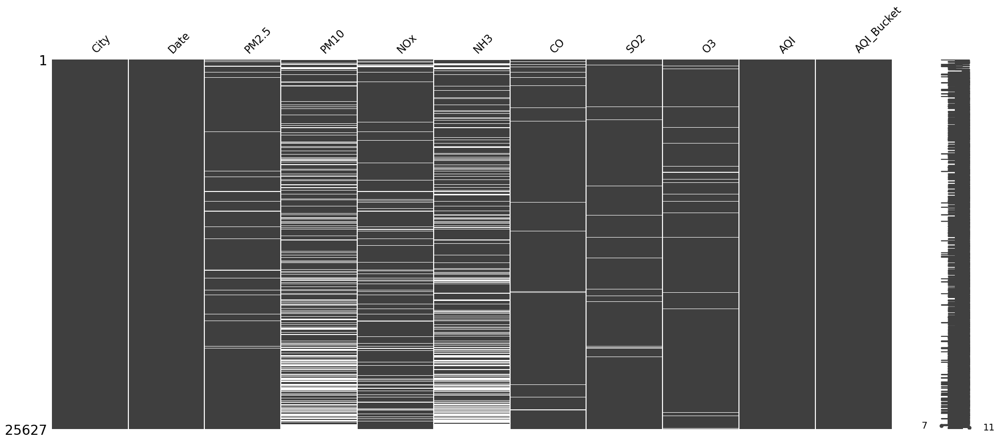

In [36]:
msno.matrix(df_cleaned_master)

In [37]:
df_cleaned_master['Date'] = pd.to_datetime(df_cleaned_master['Date'], errors='coerce')
df_cleaned_master.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25627 entries, 0 to 25626
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   City        25627 non-null  object        
 1   Date        25627 non-null  datetime64[ns]
 2   PM2.5       24884 non-null  float64       
 3   PM10        18331 non-null  float64       
 4   NOx         23639 non-null  float64       
 5   NH3         18878 non-null  float64       
 6   CO          25195 non-null  float64       
 7   SO2         25083 non-null  float64       
 8   O3          24850 non-null  float64       
 9   AQI         25627 non-null  float64       
 10  AQI_Bucket  25627 non-null  object        
dtypes: datetime64[ns](1), float64(8), object(2)
memory usage: 2.2+ MB


In [38]:
df_cleaned_master = df_cleaned_master.sort_values(['Date'])

In [39]:
df_cleaned_master

,City,Date,PM2.5,PM10,NOx,NH3,CO,SO2,O3,AQI,AQI_Bucket
24948,Delhi,2015-01-01,313.22,607.98,110.59,33.85,15.20,9.25,41.68,472.0,Severe
24818,Delhi,2015-01-02,186.18,269.55,88.14,31.83,9.54,6.65,29.97,454.0,Severe
15950,Delhi,2015-01-03,87.18,131.90,47.95,69.55,10.61,2.65,19.71,143.0,Moderate
22539,Delhi,2015-01-04,151.84,241.84,48.62,130.36,11.54,4.63,25.36,319.0,Very Poor
22703,Delhi,2015-01-05,146.60,219.13,38.25,122.88,9.20,3.33,23.20,325.0,Very Poor
...,...,...,...,...,...,...,...,...,...,...,...
4887,Bhopal,2020-07-01,14.00,30.00,3.62,8.05,0.35,12.45,48.77,69.0,Satisfactory
5085,Jaipur,2020-07-01,58.79,103.68,14.16,17.41,0.54,5.19,53.68,70.0,Satisfactory
7846,Jorapokhar,2020-07-01,NaN,102.38,NaN,7.38,1.67,10.57,18.23,86.0,Satisfactory
1530,Bengaluru,2020-07-01,17.50,30.48,14.83,7.42,0.54,6.66,15.40,43.0,Good


In [40]:
fig = px.line(df_cleaned_master, x='Date', y='AQI', color='City', title='AQI Time Series for All Cities')
fig.show()


fig2 = px.box(df_cleaned_master, x='City', y='AQI', title='AQI Distribution by City')
#fig2.update_layout(xaxis={'categoryorder':'total descending'})
fig2.show()


# Scatter plot matrix for selected features
selected_features = ['PM2.5', 'PM10', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'AQI']
fig3 = px.scatter_matrix(df_cleaned_master[selected_features], title='Scatter Plot Matrix')
fig3.show()
